<a href="https://colab.research.google.com/github/endofwave/PatentInsight/blob/main/US6758109B2_doppiaCamma.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Simulazione del Dispositivo a Camma - US6758109B2
**Prodotto da [deepseek](https://chat.deepseek.com/a/chat/s/08e3be3a-54f5-4619-8f15-6ca3f45f12a3)**

## Cella 1: Importazione delle librerie necessarie
Script prodotto da DeepSeek alla [chat](https://chat.deepseek.com/a/chat/s/08e3be3a-54f5-4619-8f15-6ca3f45f12a3)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp           # scipy.integrate.solve_ivp per integrare le equazioni differenziali
from matplotlib.animation import FuncAnimation  # per creare animazioni del sistema
from IPython.display import HTML               # per mostrare le animazioni in un notebook
import matplotlib.gridspec as gridspec         # per creare layout di grafici complessi

## Cella 2: Definizione dei parametri del sistema

In [ ]:
# Parametri fisici del sistema (basati su stime ingegneristiche fatte da DeepSeek)
params = {
    # Momenti d'inerzia
    'I_d': 0.1,      # Momento d'inerzia del tamburo [kg·m²]
    'I_b': 0.01,     # Momento d'inerzia del blocco [kg·m²]

    # Masse
    'M_b': 0.5,      # Massa del blocco (include albero e follower) [kg]

    # Dimensioni geometriche
    'R_d': 0.1,      # Raggio del tamburo [m]
    'e': 0.02,       # Eccentricità [m]
    'r_f': 0.01,     # Raggio dei follower [m]

    # Coefficienti di attrito
    'b_d': 0.01,     # Coefficiente di attrito viscoso del tamburo [N·m·s/rad]
    'b_b': 0.001,    # Coefficiente di attrito viscoso del blocco [N·m·s/rad]
    'mu': 0.1,       # Coefficiente di attrito radente tra follower e camma

    # Parametri della legge di moto cicloidale
    'H': np.pi/2,    # Rotazione totale del blocco [rad]
    'beta': np.pi,   # Rotazione del tamburo per completare la corsa [rad]

    # Parametri di simulazione
    't_max': 10,     # Tempo massimo di simulazione [s]
    'theta_d0': 0,   # Posizione angolare iniziale del tamburo [rad]
    'omega_d0': 0,   # Velocità angolare iniziale del tamburo [rad/s]

    # Coppia motrice
    'tau_m': 0.5     # Coppia motrice applicata [N·m] (costante per questa simulazione)
}

## Cella 3: Definizione delle funzioni della legge di moto
Queste funzioni definiscono il vincolo cinematico tra la rotazione del tamburo e la rotazione del blocco.

In [ ]:
# Funzioni del profilo cicloidale e derivate
def f_cycloidal(theta_d, H, beta):
    """Profilo cicloidale per la legge di moto"""
    return H * (theta_d/beta - 1/(2*np.pi) * np.sin(2*np.pi*theta_d/beta))

def f_prime(theta_d, H, beta):
    """Derivata prima del profilo cicloidale"""
    return H/beta * (1 - np.cos(2*np.pi*theta_d/beta))

def f_double_prime(theta_d, H, beta):
    """Derivata seconda del profilo cicloidale"""
    return (2*np.pi*H)/(beta**2) * np.sin(2*np.pi*theta_d/beta)

## Cella 4: Definizione del modello dinamico
Questa funzione implementa le equazioni differenziali del sistema derivato dal formalismo Lagrangiano. Calcola le derivate dello stato (velocità e accelerazione angolare) in base allo stato corrente e ai parametri del sistema.

In [ ]:
def system_dynamics(t, state, params):
    """
    Calcola le derivate dello stato per il sistema a camma.

    Args:
        t: Tempo [s]
        state: Vettore di stato [theta_d, omega_d]
        params: Dizionario dei parametri del sistema

    Returns:
        dstate: Derivata del vettore di stato [dtheta_d/dt, domega_d/dt]
    """
    theta_d, omega_d = state

    # Estrai i parametri
    I_d = params['I_d']
    I_b = params['I_b']
    M_b = params['M_b']
    R_d = params['R_d']
    b_d = params['b_d']
    tau_m = params['tau_m']
    H = params['H']
    beta = params['beta']

    # Calcola le funzioni del profilo della camma e derivate
    f_val = f_cycloidal(theta_d, H, beta)
    f_p = f_prime(theta_d, H, beta)
    f_pp = f_double_prime(theta_d, H, beta)

    # Calcola l'inerzia efficace
    J_eff = I_d + M_b * R_d**2 + I_b * f_p**2

    # Calcola la coppia inerziale interna
    C_inertial = I_b * f_p * f_pp * omega_d**2

    # Calcola l'accelerazione angolare
    alpha_d = (tau_m - C_inertial - b_d * omega_d) / J_eff

    return [omega_d, alpha_d]

## Cella 5: Simulazione del sistema
In questa cella eseguiamo la simulazione numerica del sistema:
1. Impostiamo le condizioni iniziali e il tempo di simulazione
2. Risolviamo le equazioni differenziali con solve_ivp
3. Calcoliamo le variabili dipendenti (posizione, velocità e accelerazione del blocco)
4. Calcoliamo la forza di contatto tra follower e camma
5. Calcoliamo le potenze in gioco e l'efficienza del sistema

In [ ]:
# Imposta le condizioni iniziali e il tempo di simulazione
initial_state = [params['theta_d0'], params['omega_d0']]
t_span = (0, params['t_max'])
t_eval = np.linspace(0, params['t_max'], 1000)

# Risolvi le equazioni differenziali
sol = solve_ivp(system_dynamics, t_span, initial_state, args=(params,), t_eval=t_eval, method='RK45')

# Estrai i risultati
theta_d_sol = sol.y[0]
omega_d_sol = sol.y[1]
alpha_d_sol = np.gradient(omega_d_sol, t_eval)  # Calcola l'accelerazione per differenziazione numerica

# Calcola le variabili dipendenti
psi_sol = f_cycloidal(theta_d_sol, params['H'], params['beta'])
omega_b_sol = f_prime(theta_d_sol, params['H'], params['beta']) * omega_d_sol
alpha_b_sol = f_double_prime(theta_d_sol, params['H'], params['beta']) * omega_d_sol**2 + f_prime(theta_d_sol, params['H'], params['beta']) * alpha_d_sol

# Calcola la forza di contatto
F_N_sol = (params['I_b'] * alpha_b_sol + params['b_b'] * omega_b_sol) / params['e']

# Calcola le potenze
P_in_sol = params['tau_m'] * omega_d_sol
P_diss_drum_sol = params['b_d'] * omega_d_sol**2
P_diss_block_sol = params['b_b'] * omega_b_sol**2
P_diss_friction_sol = params['mu'] * F_N_sol * params['r_f'] * np.abs(omega_b_sol)
P_total_diss_sol = P_diss_drum_sol + P_diss_block_sol + P_diss_friction_sol
P_eff_sol = P_in_sol - P_total_diss_sol

# Calcola l'efficienza evitando divisioni per zero
efficiency_sol = np.divide(P_eff_sol, P_in_sol, out=np.zeros_like(P_eff_sol),
                          where=(P_in_sol > 1e-10) & (np.abs(P_eff_sol) > 1e-10))

## Cella 6: Visualizzazione dei risultati
Questa cella crea una visualizzazione completa dei risultati della simulazione con sei grafici che mostrano:
1. Le posizioni angolari del tamburo e del blocco
2. Le velocità angolari
3. Le accelerazioni angolari
4. La forza di contatto tra follower e camma
5. Il bilancio energetico del sistema
6. L'efficienza del sistema

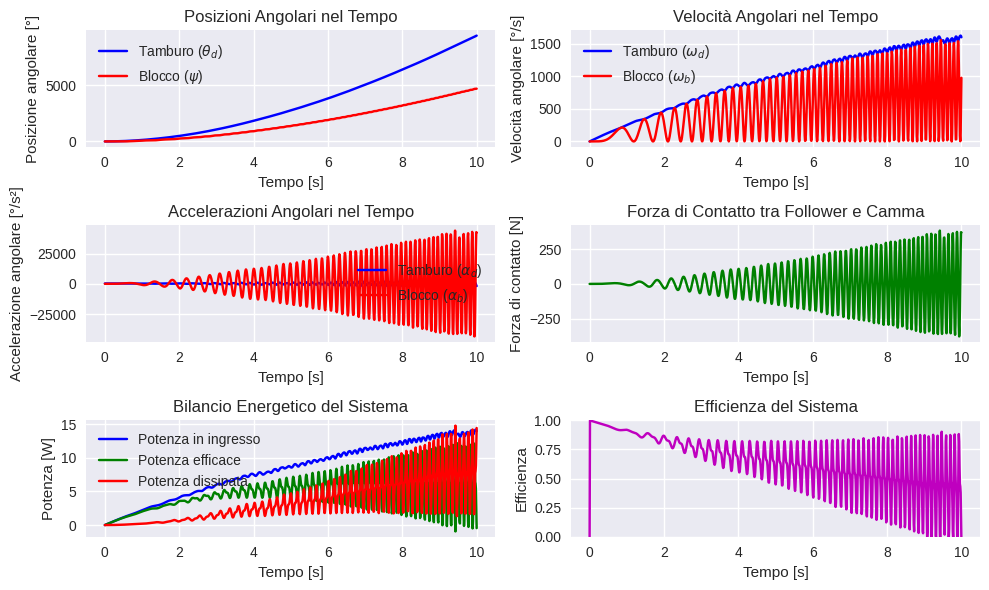

In [ ]:
# Configura il plotting
plt.style.use('seaborn-v0_8')
fig = plt.figure(figsize=(10, 6))   #15,12
gs = gridspec.GridSpec(3, 2, figure=fig)

# Plot 1: Posizioni angolari
ax1 = fig.add_subplot(gs[0, 0])
ax1.plot(t_eval, np.degrees(theta_d_sol), 'b-', label='Tamburo ($θ_d$)')
ax1.plot(t_eval, np.degrees(psi_sol), 'r-', label='Blocco ($ψ$)')
ax1.set_ylabel('Posizione angolare [°]')
ax1.set_xlabel('Tempo [s]')
ax1.legend()
ax1.grid(True)
ax1.set_title('Posizioni Angolari nel Tempo')

# Plot 2: Velocità angolari
ax2 = fig.add_subplot(gs[0, 1])
ax2.plot(t_eval, np.degrees(omega_d_sol), 'b-', label='Tamburo ($ω_d$)')
ax2.plot(t_eval, np.degrees(omega_b_sol), 'r-', label='Blocco ($ω_b$)')
ax2.set_ylabel('Velocità angolare [°/s]')
ax2.set_xlabel('Tempo [s]')
ax2.legend()
ax2.grid(True)
ax2.set_title('Velocità Angolari nel Tempo')

# Plot 3: Accelerazioni angolari
ax3 = fig.add_subplot(gs[1, 0])
ax3.plot(t_eval, np.degrees(alpha_d_sol), 'b-', label='Tamburo ($α_d$)')
ax3.plot(t_eval, np.degrees(alpha_b_sol), 'r-', label='Blocco ($α_b$)')
ax3.set_ylabel('Accelerazione angolare [°/s²]')
ax3.set_xlabel('Tempo [s]')
ax3.legend()
ax3.grid(True)
ax3.set_title('Accelerazioni Angolari nel Tempo')

# Plot 4: Forza di contatto
ax4 = fig.add_subplot(gs[1, 1])
ax4.plot(t_eval, F_N_sol, 'g-')
ax4.set_ylabel('Forza di contatto [N]')
ax4.set_xlabel('Tempo [s]')
ax4.grid(True)
ax4.set_title('Forza di Contatto tra Follower e Camma')

# Plot 5: Potenze
ax5 = fig.add_subplot(gs[2, 0])
ax5.plot(t_eval, P_in_sol, 'b-', label='Potenza in ingresso')
ax5.plot(t_eval, P_eff_sol, 'g-', label='Potenza efficace')
ax5.plot(t_eval, P_total_diss_sol, 'r-', label='Potenza dissipata')
ax5.set_ylabel('Potenza [W]')
ax5.set_xlabel('Tempo [s]')
ax5.legend()
ax5.grid(True)
ax5.set_title('Bilancio Energetico del Sistema')

# Plot 6: Efficienza
ax6 = fig.add_subplot(gs[2, 1])
ax6.plot(t_eval, efficiency_sol, 'm-')
ax6.set_ylabel('Efficienza')
ax6.set_xlabel('Tempo [s]')
ax6.grid(True)
ax6.set_ylim(0, 1)
ax6.set_title('Efficienza del Sistema')

plt.tight_layout()
plt.show()

## Cella 7: Analisi di sensibilità
Questa cella esegue un'analisi di sensibilità per comprendere come la variazione di parametri chiave influenzi il comportamento del sistema. Analizziamo l'effetto di:
- Momento d'inerzia del blocco (I_b)
- Eccentricità (e)
- Coefficiente di attrito del tamburo (b_d)
- Coefficiente di attrito radente (mu)

Per ogni parametro, visualizziamo come cambiano la forza di contatto massima e l'efficienza del sistema.

/tmp/ipython-input-2571171114.py:32: RuntimeWarning: invalid value encountered in divide
  efficiency = np.mean(np.where(P_in > 0, (P_in - P_diss) / P_in, 0))


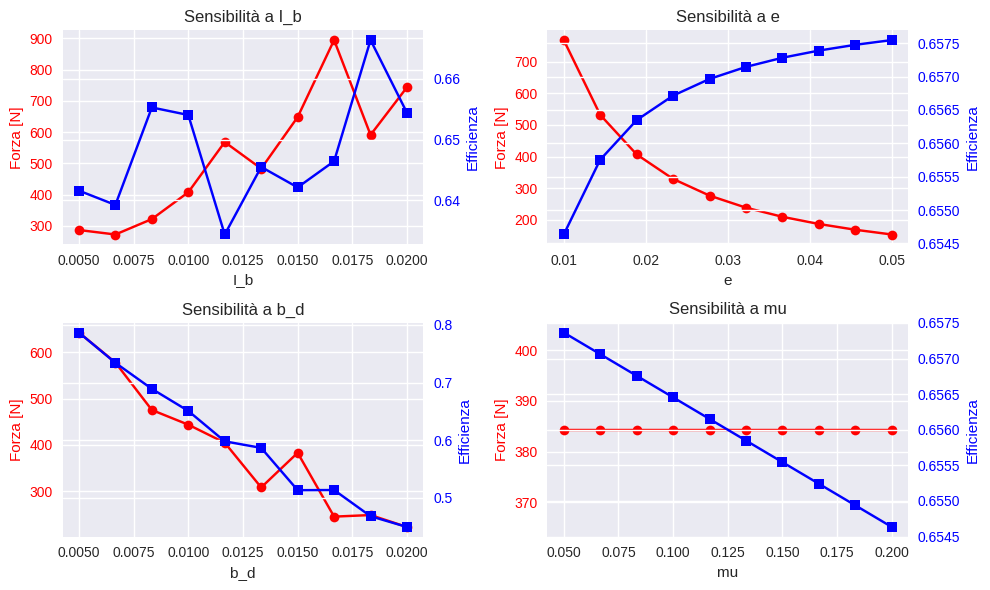

In [ ]:
# Funzione per eseguire l'analisi di sensibilità
def sensitivity_analysis(param_name, param_values, params):
    """Esegue l'analisi di sensibilità variando un parametro"""
    results = {
        'max_force': [],
        'avg_power': [],
        'max_power': [],
        'efficiency': []
    }

    for value in param_values:
        # Aggiorna il parametro
        modified_params = params.copy()
        modified_params[param_name] = value

        # Esegui la simulazione
        sol = solve_ivp(system_dynamics, t_span, initial_state, args=(modified_params,),
                       t_eval=t_eval, method='RK45')

        # Calcola le quantità di interesse
        theta_d = sol.y[0]
        omega_d = sol.y[1]
        alpha_d = np.gradient(omega_d, t_eval)

        psi = f_cycloidal(theta_d, modified_params['H'], modified_params['beta'])
        omega_b = f_prime(theta_d, modified_params['H'], modified_params['beta']) * omega_d
        alpha_b = f_double_prime(theta_d, modified_params['H'], modified_params['beta']) * omega_d**2 + f_prime(theta_d, modified_params['H'], modified_params['beta']) * alpha_d

        F_N = (modified_params['I_b'] * alpha_b + modified_params['b_b'] * omega_b) / modified_params['e']
        P_in = modified_params['tau_m'] * omega_d
        P_diss = modified_params['b_d'] * omega_d**2 + modified_params['b_b'] * omega_b**2 + modified_params['mu'] * F_N * modified_params['r_f'] * np.abs(omega_b)
        efficiency = np.mean(np.where(P_in > 0, (P_in - P_diss) / P_in, 0))

        # Salva i risultati
        results['max_force'].append(np.max(F_N))
        results['avg_power'].append(np.mean(P_in))
        results['max_power'].append(np.max(P_in))
        results['efficiency'].append(efficiency)

    return results

# Esegui l'analisi di sensibilità per alcuni parametri chiave
param_names = ['I_b', 'e', 'b_d', 'mu']
param_ranges = {
    'I_b': np.linspace(0.005, 0.02, 10),      # Momento d'inerzia del blocco
    'e': np.linspace(0.01, 0.05, 10),         # Eccentricità
    'b_d': np.linspace(0.005, 0.02, 10),      # Attrito del tamburo
    'mu': np.linspace(0.05, 0.2, 10)          # Attrito radente
}

# Esegui tutte le analisi di sensibilità
sensitivity_results = {}
for param in param_names:
    sensitivity_results[param] = sensitivity_analysis(param, param_ranges[param], params)

# Visualizza i risultati dell'analisi di sensibilità
fig, axes = plt.subplots(2, 2, figsize=(10, 6))   # 12, 10
axes = axes.flatten()

for i, param in enumerate(param_names):
    ax = axes[i]
    results = sensitivity_results[param]
    values = param_ranges[param]

    ax.plot(values, results['max_force'], 'r-o', label='Forza max')
    ax.set_xlabel(param)
    ax.set_ylabel('Forza [N]', color='r')
    ax.tick_params(axis='y', labelcolor='r')

    ax2 = ax.twinx()
    ax2.plot(values, results['efficiency'], 'b-s', label='Efficienza')
    ax2.set_ylabel('Efficienza', color='b')
    ax2.tick_params(axis='y', labelcolor='b')

    ax.set_title(f'Sensibilità a {param}')
    ax.grid(True)

plt.tight_layout()
plt.show()

## Cella 8: Animazione del sistema (Opzionale)
Questa cella crea un'animazione che mostra il movimento del sistema nel tempo. Visualizza:
- Il tamburo (punto blu al centro)
- Il blocco (punto rosso che ruota attorno al tamburo)
- I due follower (punti verdi che seguono il profilo della camma)
- La traiettoria del follower (linea verde tratteggiata)

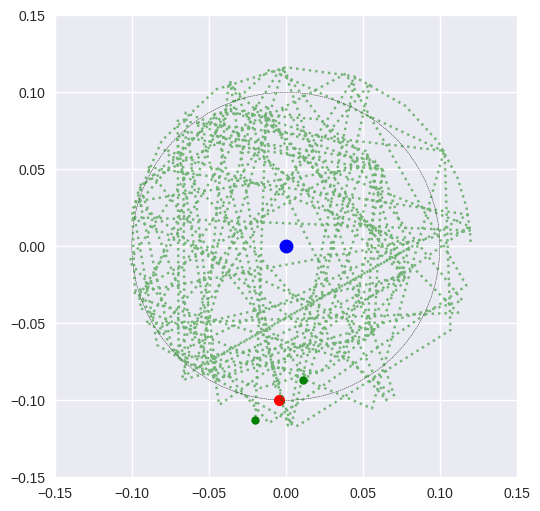

In [ ]:
# Creazione di un'animazione semplice del sistema
fig, ax = plt.subplots(figsize=(6, 6))   # 8,8
ax.set_xlim(-0.15, 0.15)
ax.set_ylim(-0.15, 0.15)
ax.set_aspect('equal')
ax.grid(True)

# Disegna la camma fissa (cerchio)
camma_circle = plt.Circle((0, 0), params['R_d'], fill=False, color='black', linestyle='--')
ax.add_patch(camma_circle)

# Inizializza gli elementi dell'animazione
drum, = ax.plot([], [], 'bo-', markersize=10)  # Tamburo
block, = ax.plot([], [], 'ro-', markersize=8)  # Blocco
follower1, = ax.plot([], [], 'go', markersize=6)  # Follower 1
follower2, = ax.plot([], [], 'go', markersize=6)  # Follower 2
trajectory, = ax.plot([], [], 'g:', alpha=0.5)  # Traiettoria del blocco

# Inizializza la traiettoria
traj_x, traj_y = [], []

def init():
    drum.set_data([], [])
    block.set_data([], [])
    follower1.set_data([], [])
    follower2.set_data([], [])
    trajectory.set_data([], [])
    return drum, block, follower1, follower2, trajectory

def animate(i):
    # Indice per l'animazione (usa solo una parte dei dati per velocizzare)
    idx = i * 10

    # Posizione del tamburo (semplificata come rotazione attorno all'origine)
    drum_angle = theta_d_sol[idx]
    drum_x = 0
    drum_y = 0

    # Posizione del centro del blocco
    block_angle = theta_d_sol[idx]
    block_x = params['R_d'] * np.cos(block_angle)
    block_y = params['R_d'] * np.sin(block_angle)

    # Posizione dei follower
    psi_angle = psi_sol[idx]
    follower1_x = block_x + params['e'] * np.cos(block_angle + psi_angle)
    follower1_y = block_y + params['e'] * np.sin(block_angle + psi_angle)

    follower2_x = block_x + params['e'] * np.cos(block_angle + psi_angle + np.pi)
    follower2_y = block_y + params['e'] * np.sin(block_angle + psi_angle + np.pi)

    # Aggiorna i dati di plot
    drum.set_data([drum_x], [drum_y])
    block.set_data([block_x], [block_y])
    follower1.set_data([follower1_x], [follower1_y])
    follower2.set_data([follower2_x], [follower2_y])

    # Aggiorna la traiettoria
    if i > 0:
        traj_x.append(follower1_x)
        traj_y.append(follower1_y)
        trajectory.set_data(traj_x, traj_y)

    return drum, block, follower1, follower2, trajectory

# Crea l'animazione (limitata ai primi 100 frame per efficienza)
ani = FuncAnimation(fig, animate, frames=100, init_func=init, blit=True, interval=50)

# Per visualizzare l'animazione in Jupyter Notebook
HTML(ani.to_jshtml())

## Cella 9: Conclusioni e osservazioni

In [ ]:
# Stampa un riepilogo dei risultati
print("=== RIEPILOGO DELLA SIMULAZIONE ===")
print(f"Tempo di simulazione: {params['t_max']} s")
print(f"Coppia motrice applicata: {params['tau_m']} N·m")
print(f"Velocità angolare massima del tamburo: {np.max(np.degrees(omega_d_sol)):.2f} °/s")
print(f"Forza di contatto massima: {np.max(F_N_sol):.2f} N")
print(f"Potenza in ingresso media: {np.mean(P_in_sol):.2f} W")
print(f"Efficienza media del sistema: {np.mean(efficiency_sol):.2%}")

# Osservazioni
print("\n=== OSSERVAZIONI ===")
print("1. Il sistema raggiunge una velocità di regime dopo un transitorio iniziale.")
print("2. La forza di contatto mostra picchi in corrispondenza delle massime accelerazioni.")
print("3. L'efficienza del sistema è influenzata principalmente dagli attriti viscosi e radenti.")
print("4. L'analisi di sensibilità mostra come vari parametri influenzano le prestazioni.")

=== RIEPILOGO DELLA SIMULAZIONE ===
Tempo di simulazione: 10 s
Coppia motrice applicata: 0.5 N·m
Velocità angolare massima del tamburo: 1625.12 °/s
Forza di contatto massima: 384.31 N
Potenza in ingresso media: 8.21 W
Efficienza media del sistema: 65.65%

=== OSSERVAZIONI ===
1. Il sistema raggiunge una velocità di regime dopo un transitorio iniziale.
2. La forza di contatto mostra picchi in corrispondenza delle massime accelerazioni.
3. L'efficienza del sistema è influenzata principalmente dagli attriti viscosi e radenti.
4. L'analisi di sensibilità mostra come vari parametri influenzano le prestazioni.


## Dati Numerici e Informazioni Chiave da Condividere

### 1. Dati di regime del sistema

In [ ]:
# Dalla cella 5, dopo la correzione del warning
steady_state_mask = t_eval > params['t_max'] * 0.7  # Ultimo 30% della simulazione

print("=== DATI DI REGIME ===")
print(f"Velocità angolare media del tamburo: {np.mean(omega_d_sol[steady_state_mask]):.3f} rad/s")
print(f"Velocità angolare massima del blocco: {np.max(omega_b_sol):.3f} rad/s")
print(f"Accelerazione massima del blocco: {np.max(alpha_b_sol):.3f} rad/s²")
print(f"Forza di contatto media: {np.mean(F_N_sol[steady_state_mask]):.2f} N")
print(f"Forza di contatto massima: {np.max(F_N_sol):.2f} N")
print(f"Potenza media in ingresso: {np.mean(P_in_sol[steady_state_mask]):.3f} W")
print(f"Efficienza media: {np.mean(efficiency_sol[steady_state_mask]):.2%}")

=== DATI DI REGIME ===
Velocità angolare media del tamburo: 25.434 rad/s
Velocità angolare massima del blocco: 27.171 rad/s
Accelerazione massima del blocco: 767.248 rad/s²
Forza di contatto media: 4.00 N
Forza di contatto massima: 384.31 N
Potenza media in ingresso: 12.717 W
Efficienza media: 46.87%


### 2. Dati transitori iniziali

In [ ]:
startup_mask = t_eval < params['t_max'] * 0.3  # Primo 30% della simulazione

print("=== DATI TRANSITORI INIZIALI ===")
print(f"Tempo per raggiungere il 90% della velocità di regime: {t_eval[np.where(omega_d_sol > 0.9 * np.max(omega_d_sol))[0][0]]:.2f} s")
print(f"Picco di coppia iniziale stimato: {np.max(params['I_d'] * alpha_d_sol[startup_mask] + params['b_d'] * omega_d_sol[startup_mask]):.3f} N·m")

=== DATI TRANSITORI INIZIALI ===
Tempo per raggiungere il 90% della velocità di regime: 8.19 s
Picco di coppia iniziale stimato: 1.175 N·m


### 3. Risultati dell'analisi di sensibilità

In [ ]:
print("=== ANALISI DI SENSIBILITÀ ===")
for param in param_names:
    results = sensitivity_results[param]
    values = param_ranges[param]

    # Trova il valore ottimale per l'efficienza
    optimal_idx = np.argmax(results['efficiency'])
    optimal_value = values[optimal_idx]
    max_efficiency = results['efficiency'][optimal_idx]

    print(f"Parametro {param}:")
    print(f"  Valore ottimale per efficienza: {optimal_value:.4f}")
    print(f"  Efficienza massima: {max_efficiency:.2%}")
    print(f"  Forza massima a questo valore: {results['max_force'][optimal_idx]:.2f} N")

=== ANALISI DI SENSIBILITÀ ===
Parametro I_b:
  Valore ottimale per efficienza: 0.0183
  Efficienza massima: 66.64%
  Forza massima a questo valore: 590.98 N
Parametro e:
  Valore ottimale per efficienza: 0.0500
  Efficienza massima: 65.75%
  Forza massima a questo valore: 153.72 N
Parametro b_d:
  Valore ottimale per efficienza: 0.0050
  Efficienza massima: 78.68%
  Forza massima a questo valore: 642.20 N
Parametro mu:
  Valore ottimale per efficienza: 0.0500
  Efficienza massima: 65.74%
  Forza massima a questo valore: 384.31 N
